In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from dogo.results import get_experiment_details
from dogo.wasserstein.wasserstein_distance import experiment_distances

In [3]:
SCORES_BASE_DIR = "/home/ajc348/rds/hpc-work/dogo_results/mopo/model_scoring"

In [4]:
def get_wd_results(exp):
    exp_details = get_experiment_details(exp)
    model_dir = os.path.join(exp_details.results_dir, 'models')
    scores_dir = os.path.join(SCORES_BASE_DIR, model_dir.split("/")[-3], model_dir.split("/")[-2])
    return pd.read_json(os.path.join(scores_dir, 'wasserstein_distances.json'))

In [5]:
def results_across_seeds(exps):
    results = []
    datasets = []
    for exp in exps:
        distances_df = get_wd_results(exp)
        if len(datasets) == 0:
            datasets = list(distances_df.columns)
        results.append(distances_df.values)
    results = np.stack(results, axis=-1)
    return results.mean(axis=-1), results.std(axis=-1), datasets

In [6]:
def distances_plot(wd_means_arr, wd_std_arr, datasets, differences=False):
    fig, ax = plt.subplots(1, 1, figsize=(len(datasets),len(datasets)))

    mat = ax.matshow(wd_means_arr)
    ax.set_xticks(range(len(datasets)))
    ax.set_yticks(range(len(datasets)))
    ax.set_xticklabels(datasets, rotation=45)
    ax.set_yticklabels(datasets, rotation=45)

    for (i,j), z in np.ndenumerate(wd_means_arr):
        if z != 0:
            if differences:
                std_sum = 2*wd_std_arr[i,j]
                ax.text(j, i, f'{z:.2f}\n({std_sum:.2f})', ha="center", va="center", color='k' if z > std_sum else 'r')
            else:
                ax.text(j, i, f'{z:.2f}\n±{2*wd_std_arr[i,j]:.2f}', ha="center", va="center", color='w' if i == j else 'k')

    fig.colorbar(mat)

    return fig

# MIXED-3

In [7]:
mixed_3_no_rex_avg, mixed_3_no_rex_std, mixed_3_datasets = results_across_seeds(['MP329', 'MP330', 'MP331'])
mixed_3_rex_01_avg, mixed_3_rex_01_std, _ = results_across_seeds(['MP332', 'MP333', 'MP334'])
mixed_3_rex_1_avg, mixed_3_rex_1_std, _   = results_across_seeds(['MP335', 'MP336', 'MP337'])
mixed_3_rex_10_avg, mixed_3_rex_10_std, _ = results_across_seeds(['MP338', 'MP339', 'MP340'])

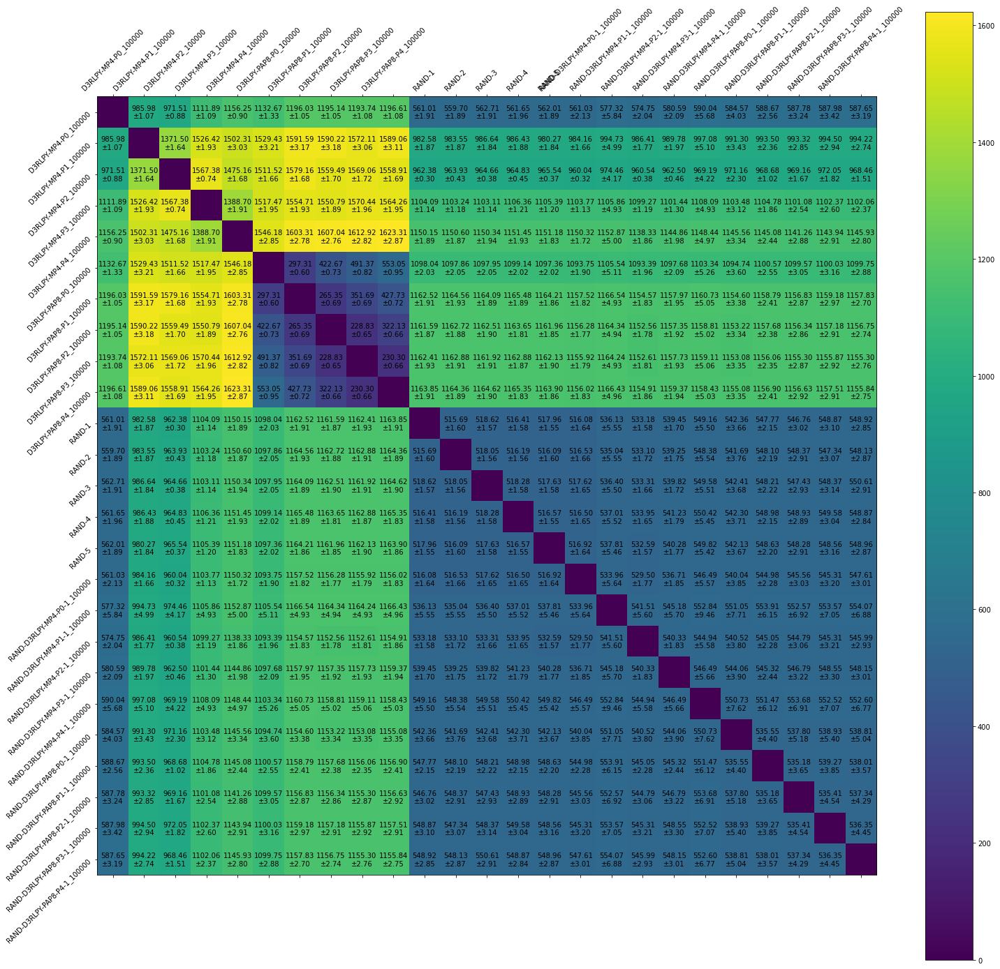

In [8]:
distances_plot(mixed_3_no_rex_avg, mixed_3_no_rex_std, mixed_3_datasets)
pass

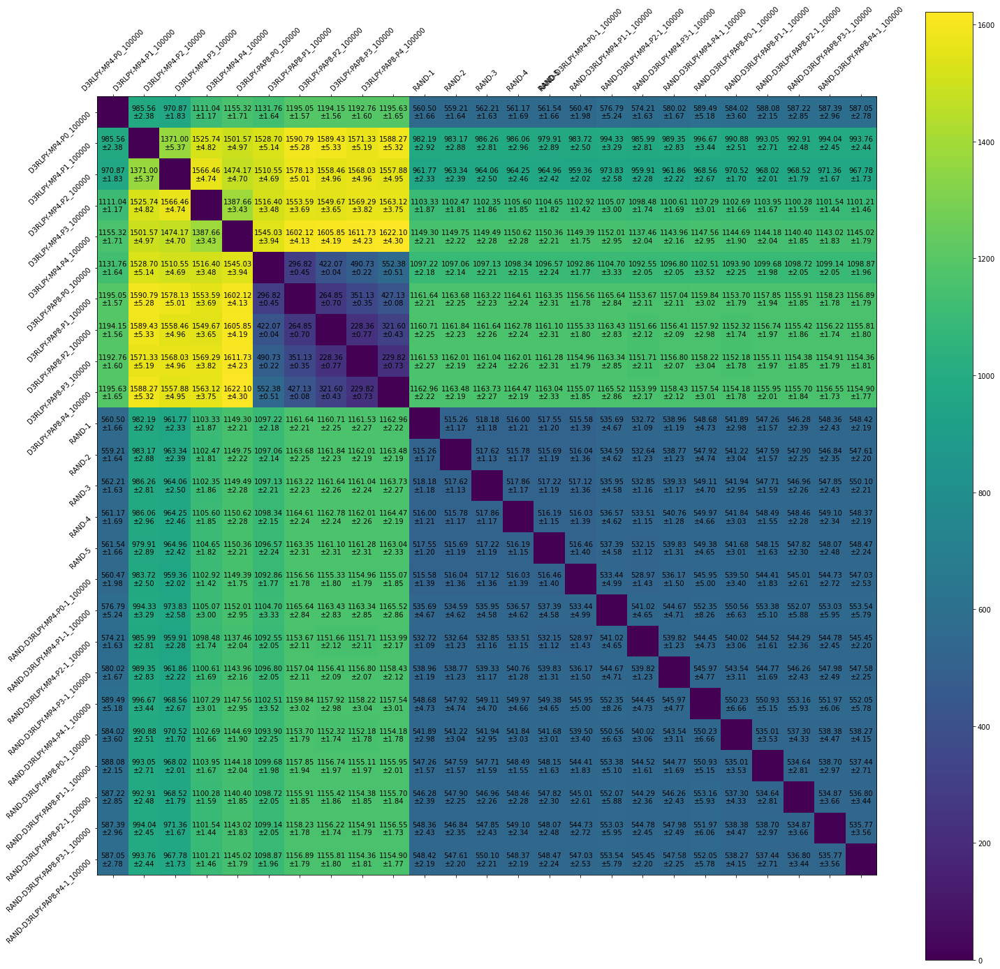

In [9]:
distances_plot(mixed_3_rex_01_avg, mixed_3_rex_01_std, mixed_3_datasets)
pass

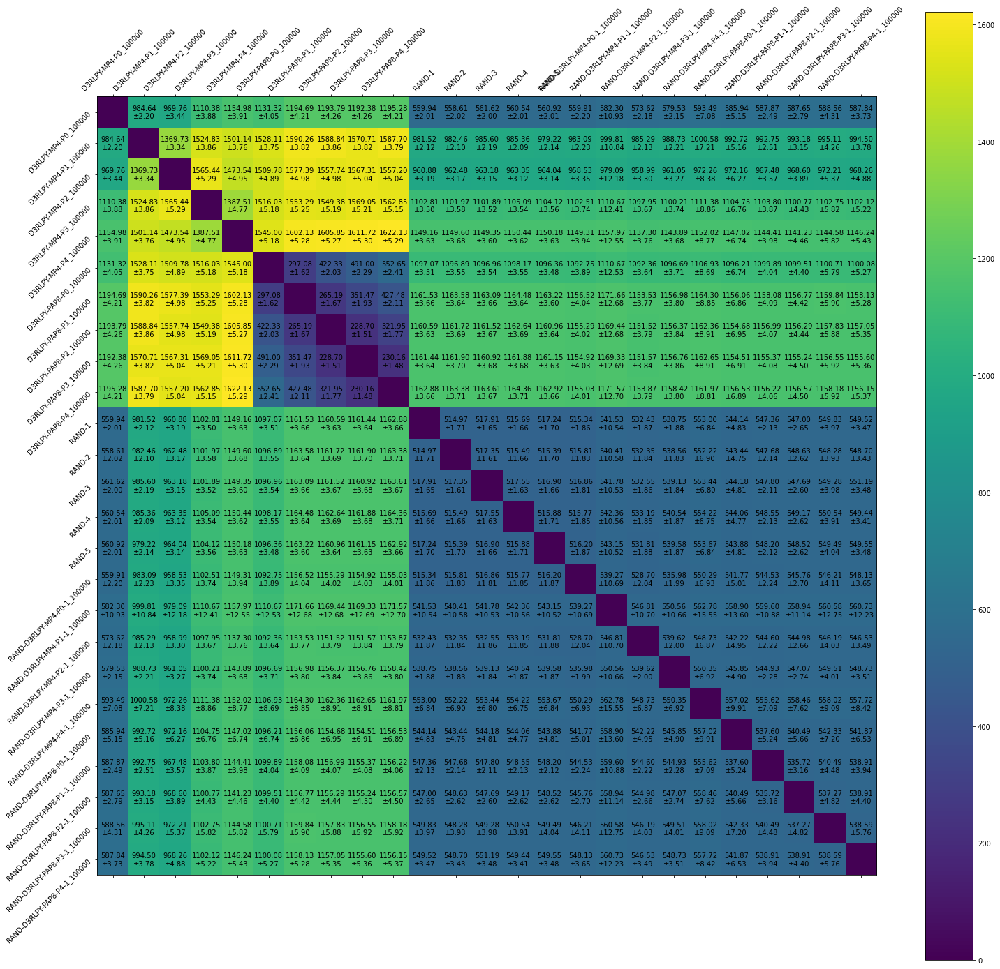

In [10]:
distances_plot(mixed_3_rex_1_avg, mixed_3_rex_1_std, mixed_3_datasets)
pass

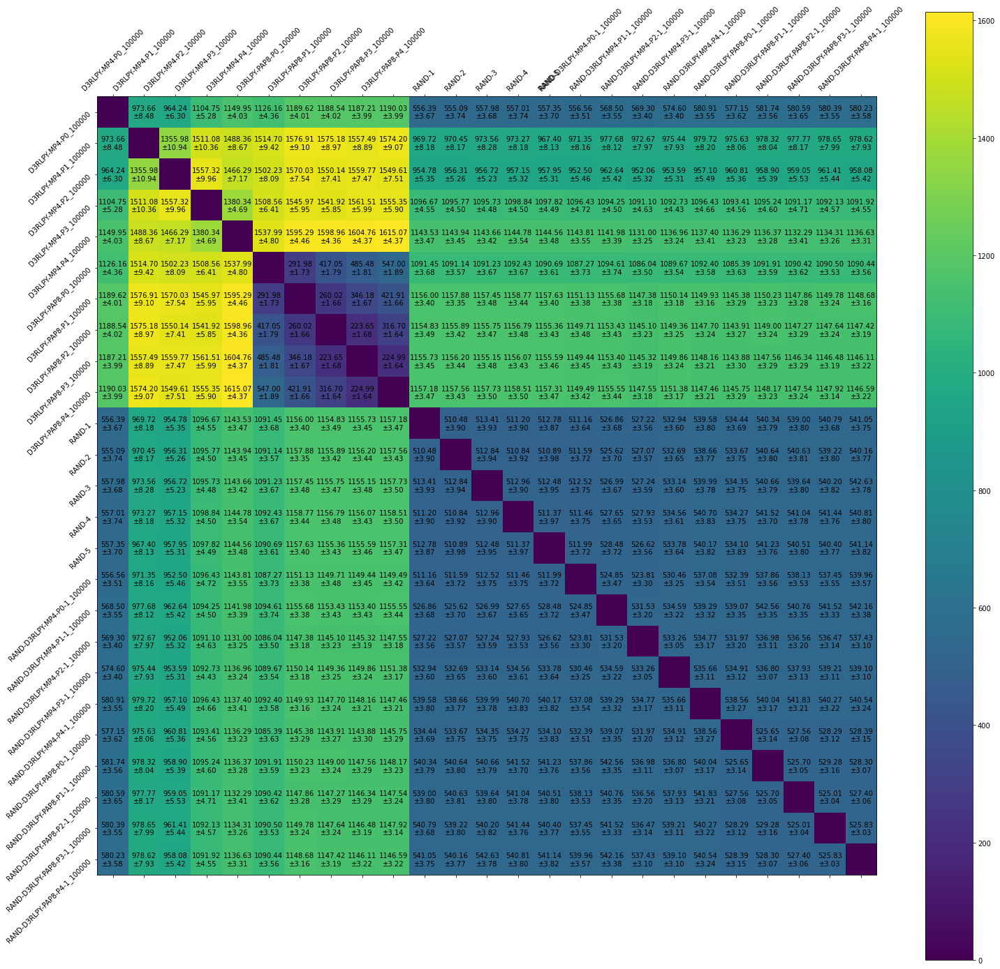

In [11]:
distances_plot(mixed_3_rex_10_avg, mixed_3_rex_10_std, mixed_3_datasets)
pass

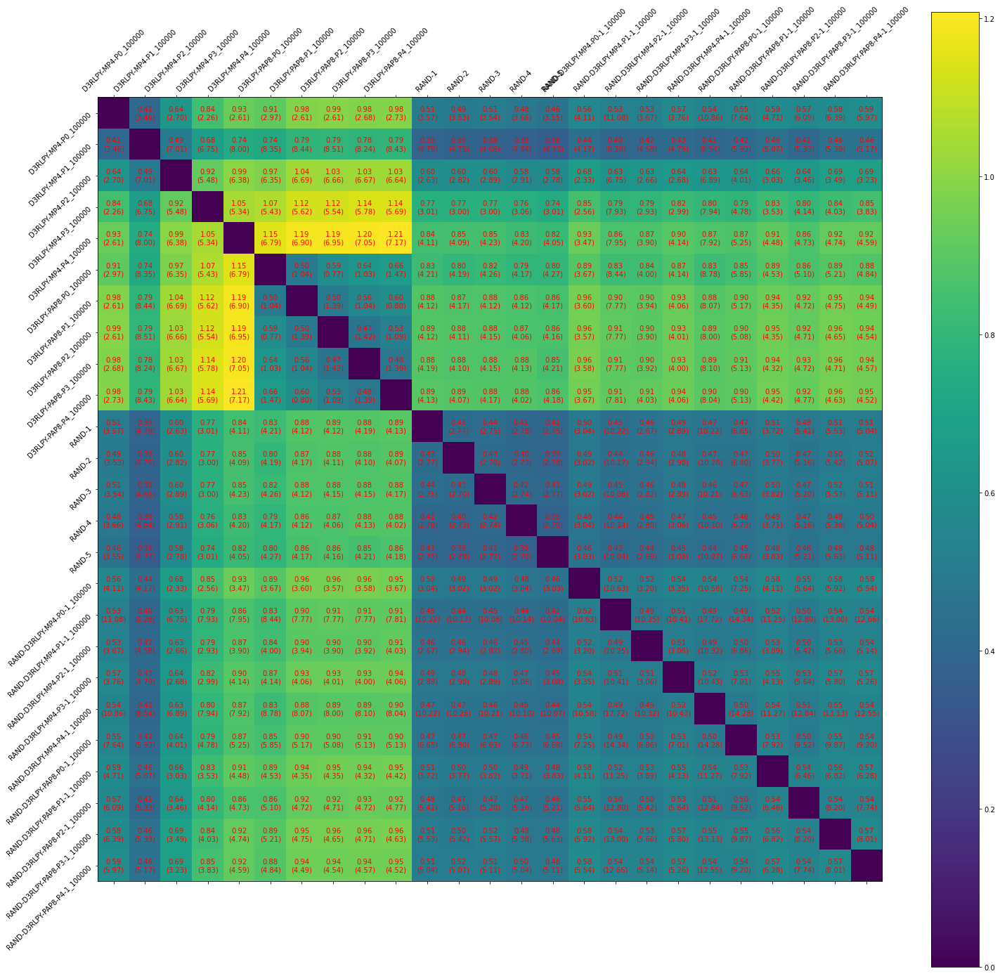

In [12]:
distances_plot(mixed_3_no_rex_avg-mixed_3_rex_01_avg, mixed_3_no_rex_std+mixed_3_rex_01_std, mixed_3_datasets, differences=True)
pass

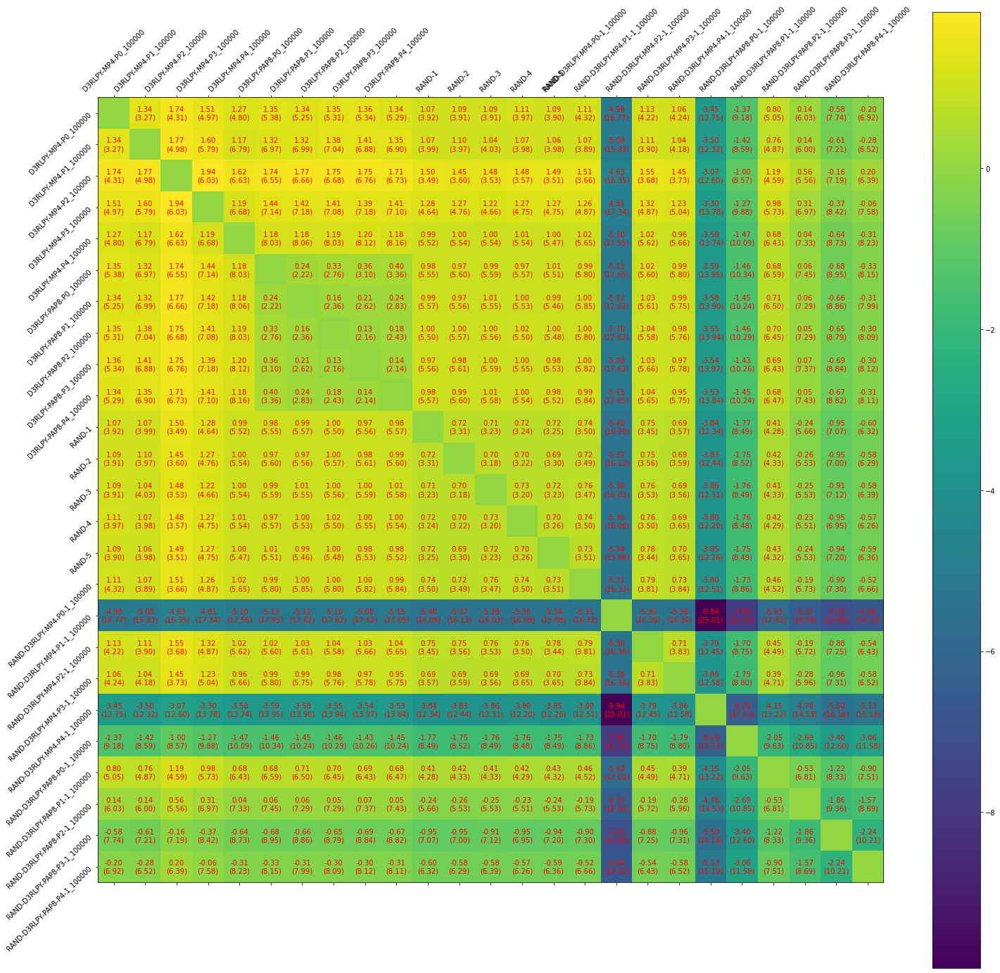

In [13]:
distances_plot(mixed_3_no_rex_avg-mixed_3_rex_1_avg, mixed_3_no_rex_std+mixed_3_rex_1_std, mixed_3_datasets, differences=True)
pass

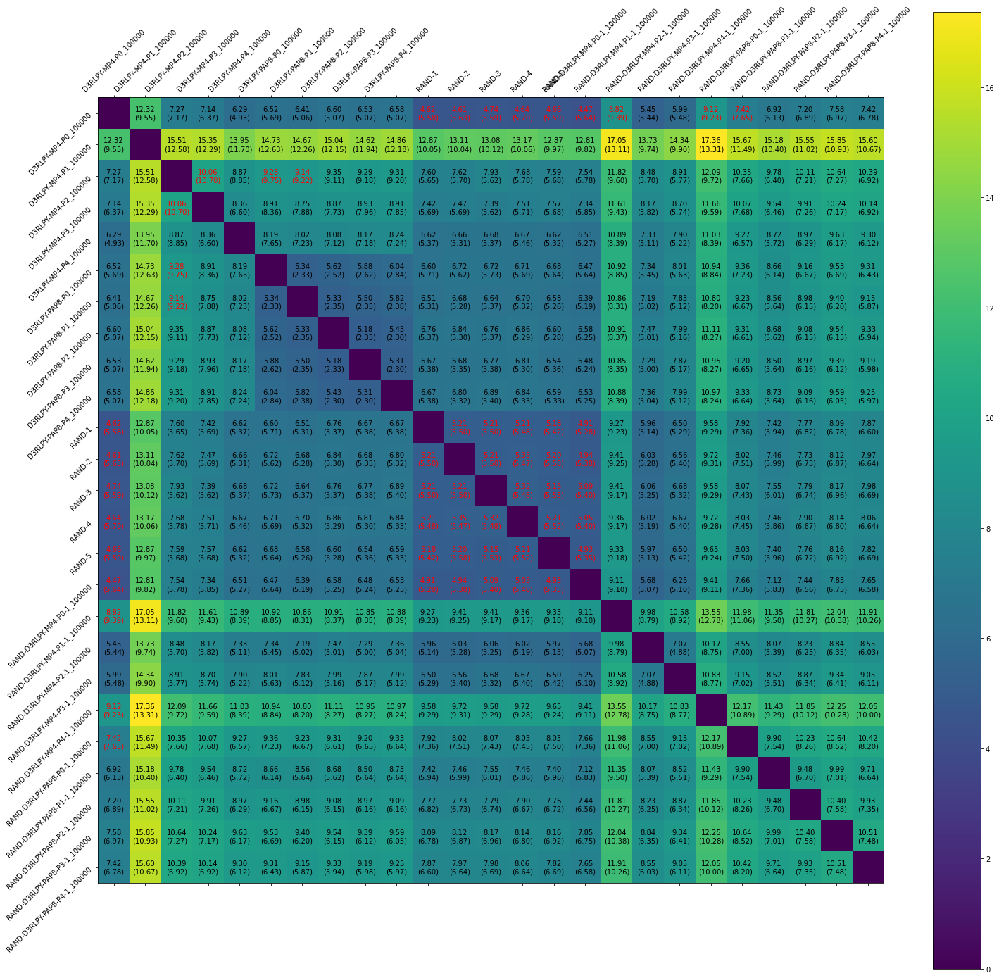

In [14]:
distances_plot(mixed_3_no_rex_avg-mixed_3_rex_10_avg, mixed_3_no_rex_std+mixed_3_rex_10_std, mixed_3_datasets, differences=True)
pass

# MIXED-3-PO-1

In [15]:
mixed_3_po_1_no_rex_avg, mixed_3_po_1_no_rex_std, mixed_3_po_1_datasets = results_across_seeds(['MP341', 'MP342', 'MP343'])
mixed_3_po_1_rex_01_avg, mixed_3_po_1_rex_01_std, _ = results_across_seeds(['MP344', 'MP345', 'MP346'])
mixed_3_po_1_rex_1_avg, mixed_3_po_1_rex_1_std, _   = results_across_seeds(['MP347', 'MP348', 'MP349'])
mixed_3_po_1_rex_10_avg, mixed_3_po_1_rex_10_std, _ = results_across_seeds(['MP350', 'MP351', 'MP352'])

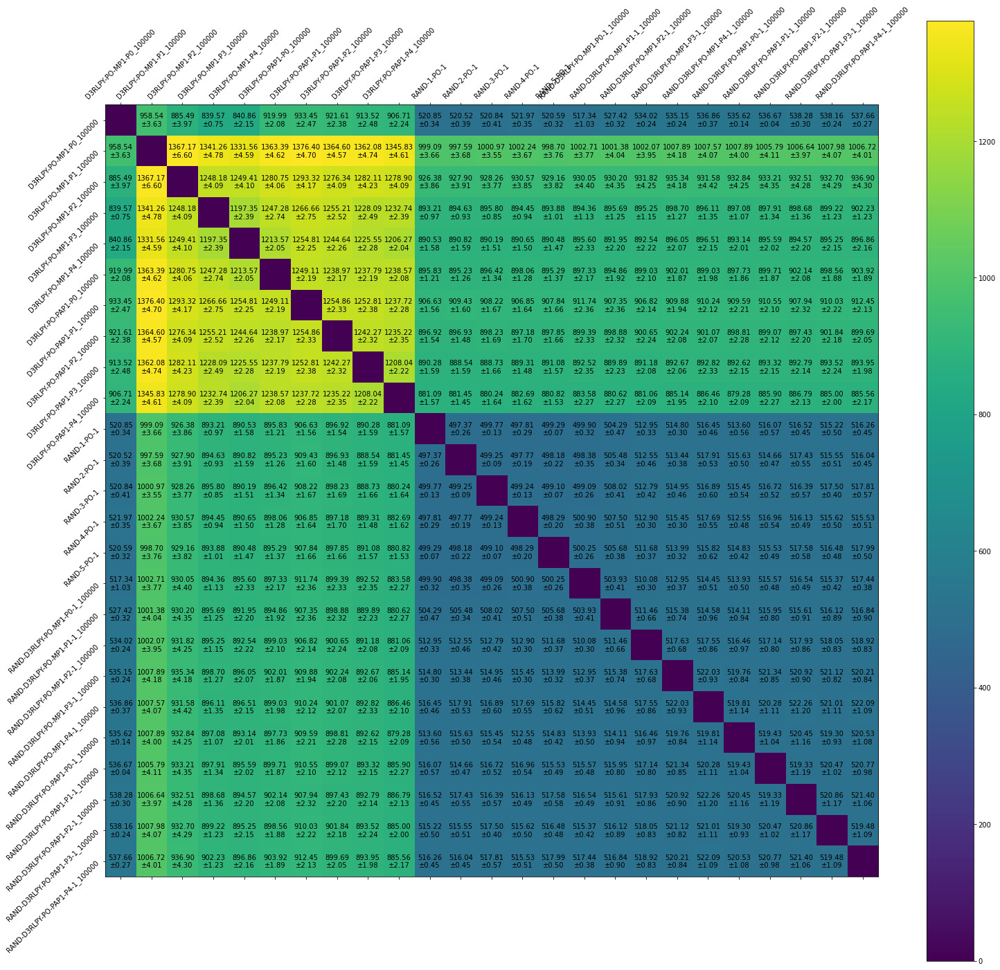

In [16]:
distances_plot(mixed_3_po_1_no_rex_avg, mixed_3_po_1_no_rex_std, mixed_3_po_1_datasets)
pass

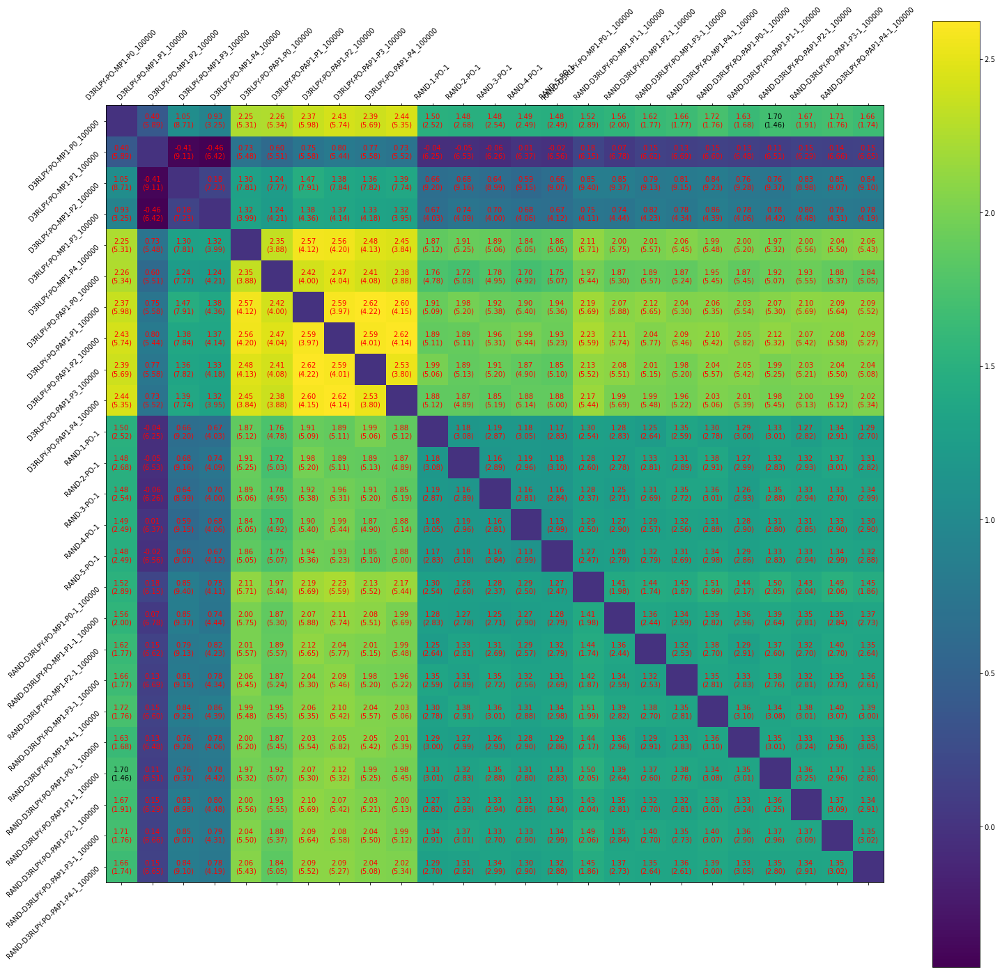

In [17]:
distances_plot(mixed_3_po_1_no_rex_avg-mixed_3_po_1_rex_01_avg, mixed_3_po_1_no_rex_std+mixed_3_po_1_rex_01_std, mixed_3_po_1_datasets, differences=True)
pass

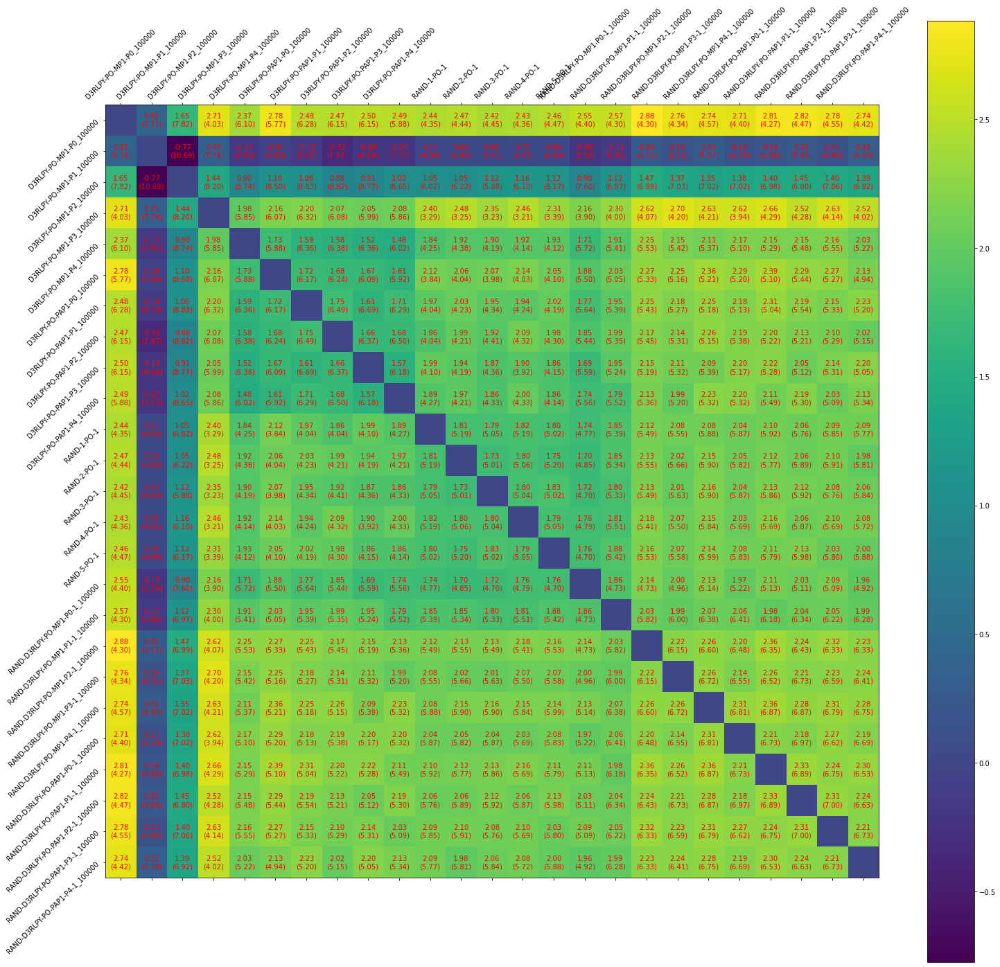

In [18]:
distances_plot(mixed_3_po_1_no_rex_avg-mixed_3_po_1_rex_1_avg, mixed_3_po_1_no_rex_std+mixed_3_po_1_rex_1_std, mixed_3_po_1_datasets, differences=True)
pass

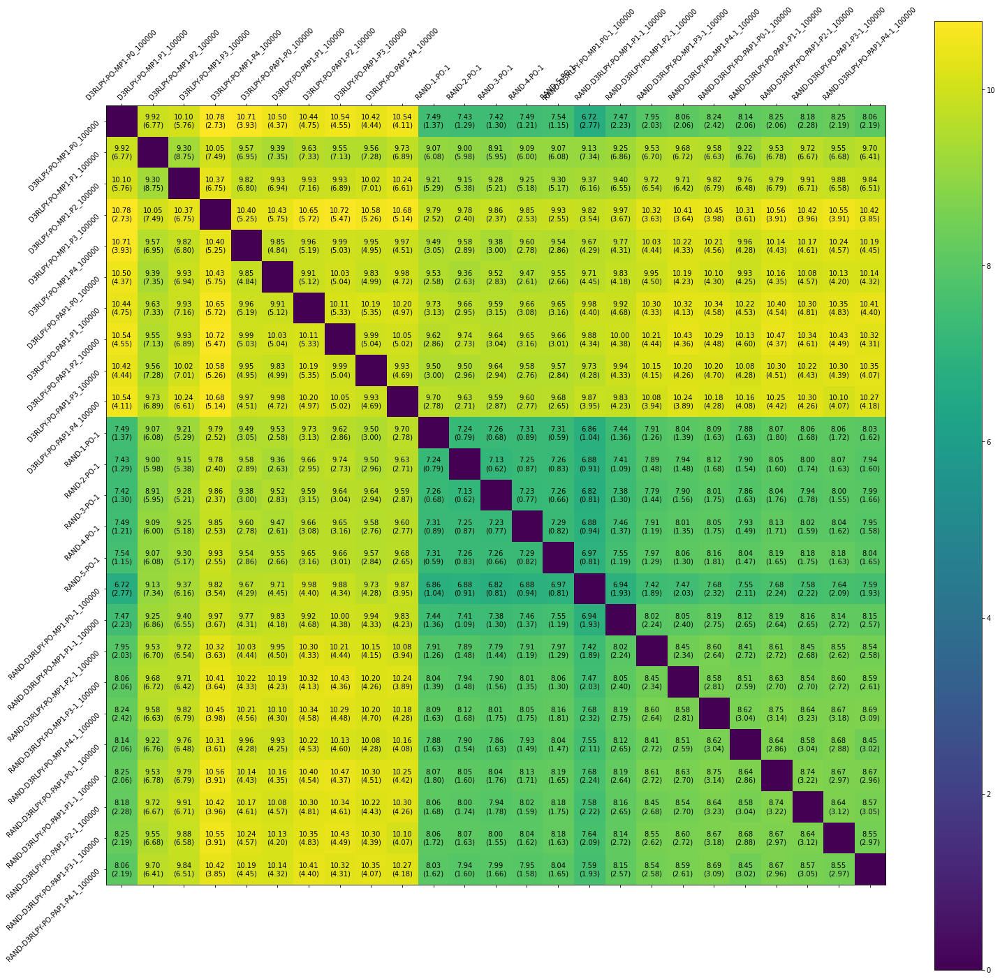

In [19]:
distances_plot(mixed_3_po_1_no_rex_avg-mixed_3_po_1_rex_10_avg, mixed_3_po_1_no_rex_std+mixed_3_po_1_rex_10_std, mixed_3_po_1_datasets, differences=True)
pass

# MIXED-3-PO-2

In [20]:
mixed_3_po_2_no_rex_avg, mixed_3_po_2_no_rex_std, mixed_3_po_2_datasets = results_across_seeds(['MP353', 'MP354', 'MP355'])
mixed_3_po_2_rex_01_avg, mixed_3_po_2_rex_01_std, _ = results_across_seeds(['MP356', 'MP357', 'MP358'])
mixed_3_po_2_rex_1_avg, mixed_3_po_2_rex_1_std, _   = results_across_seeds(['MP359', 'MP360', 'MP361'])
mixed_3_po_2_rex_10_avg, mixed_3_po_2_rex_10_std, _ = results_across_seeds(['MP362', 'MP363', 'MP364'])

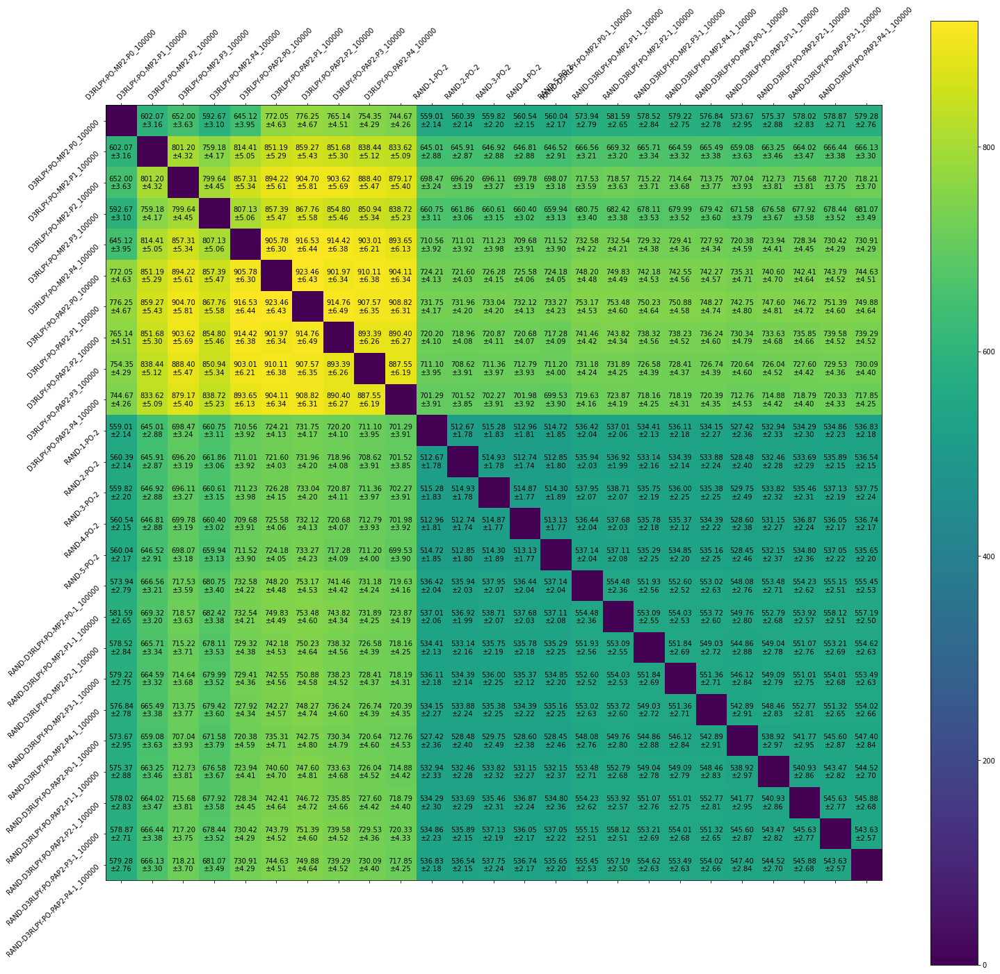

In [21]:
distances_plot(mixed_3_po_2_no_rex_avg, mixed_3_po_2_no_rex_std, mixed_3_po_2_datasets)
pass

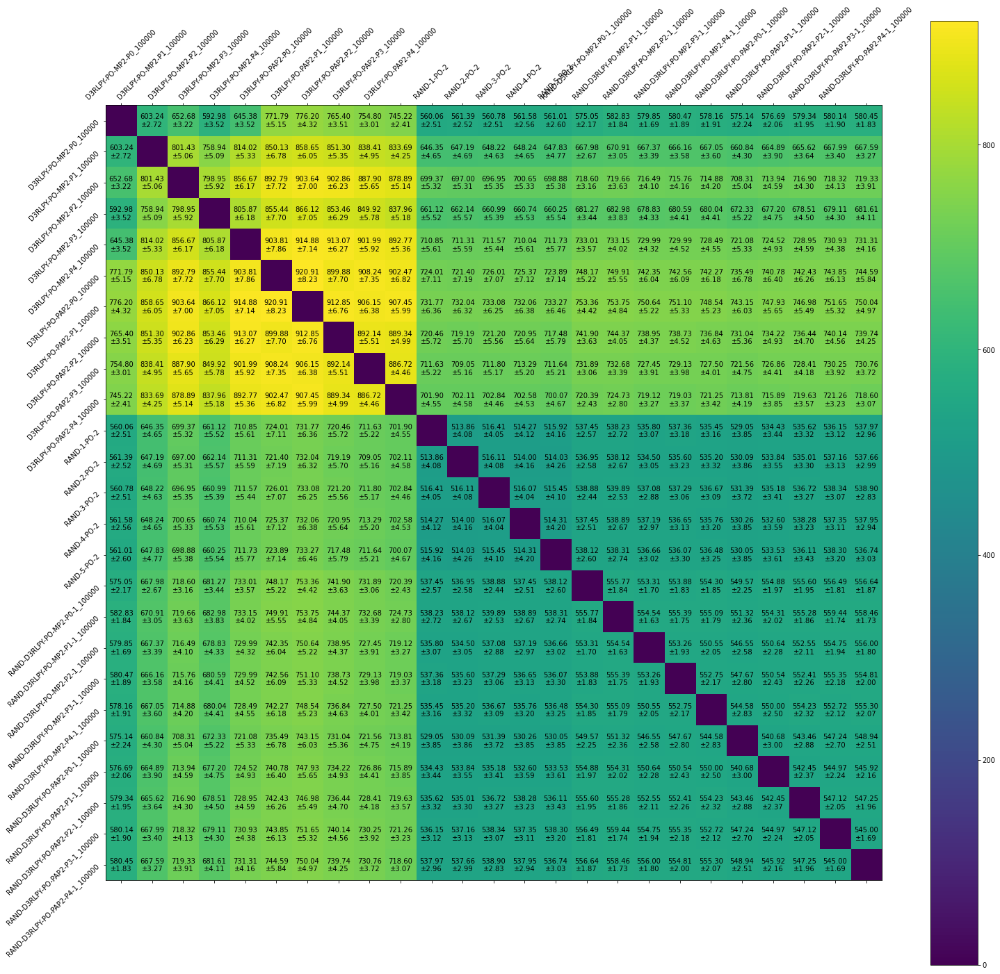

In [22]:
distances_plot(mixed_3_po_2_rex_10_avg, mixed_3_po_2_rex_10_std, mixed_3_po_2_datasets)
pass

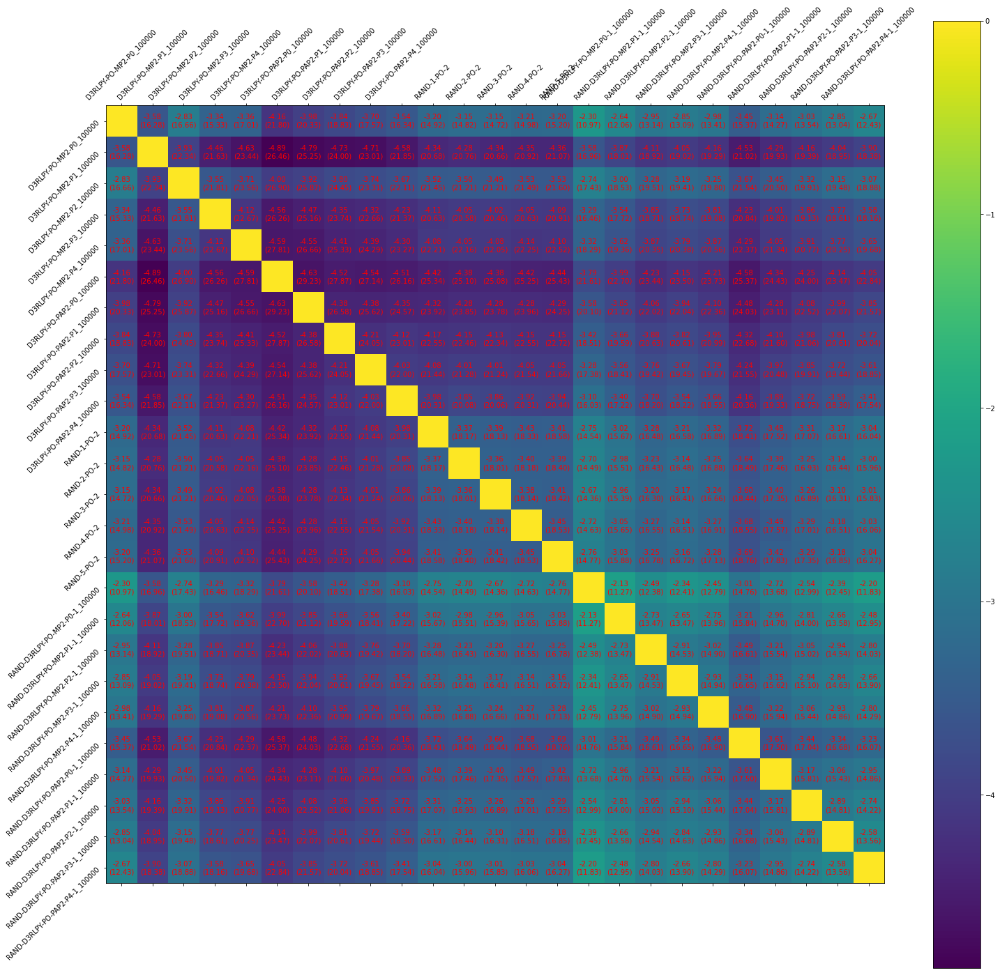

In [23]:
distances_plot(mixed_3_po_2_no_rex_avg-mixed_3_po_2_rex_01_avg, mixed_3_po_2_no_rex_std+mixed_3_po_2_rex_01_std, mixed_3_po_2_datasets, differences=True)
pass

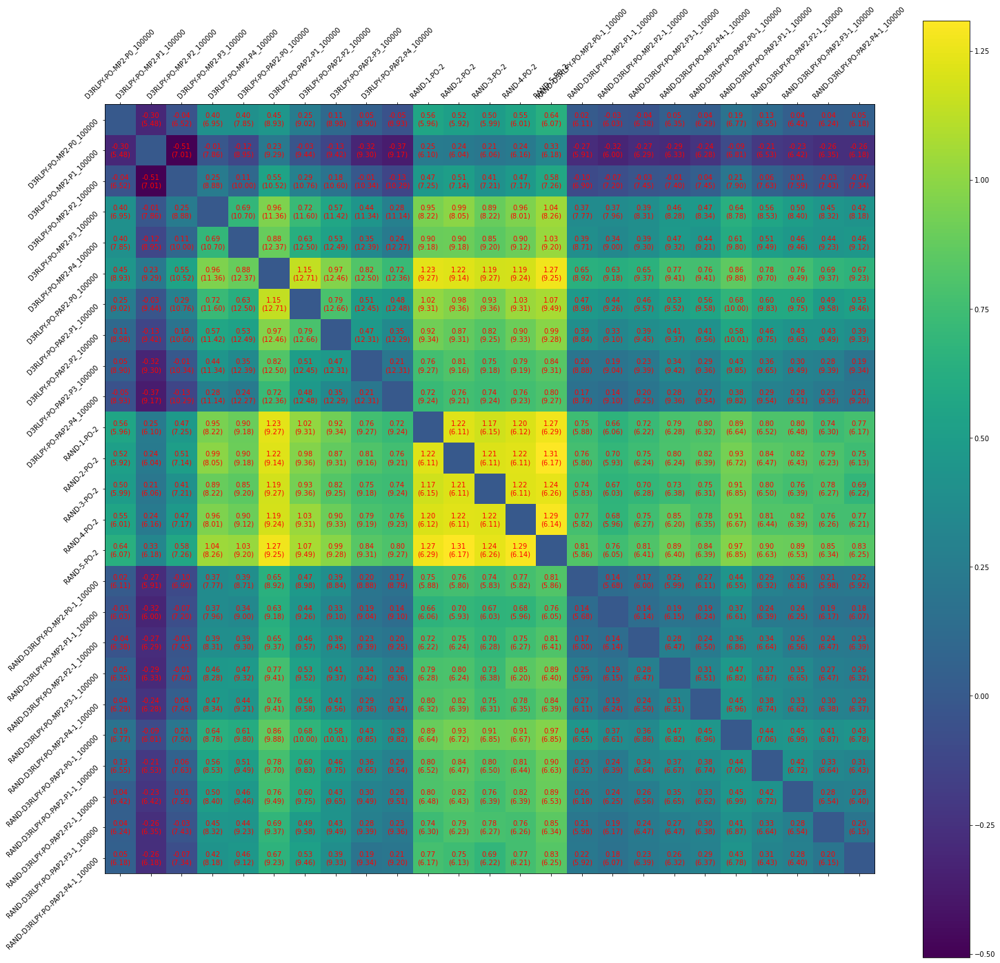

In [24]:
distances_plot(mixed_3_po_2_no_rex_avg-mixed_3_po_2_rex_1_avg, mixed_3_po_2_no_rex_std+mixed_3_po_2_rex_1_std, mixed_3_po_2_datasets, differences=True)
pass

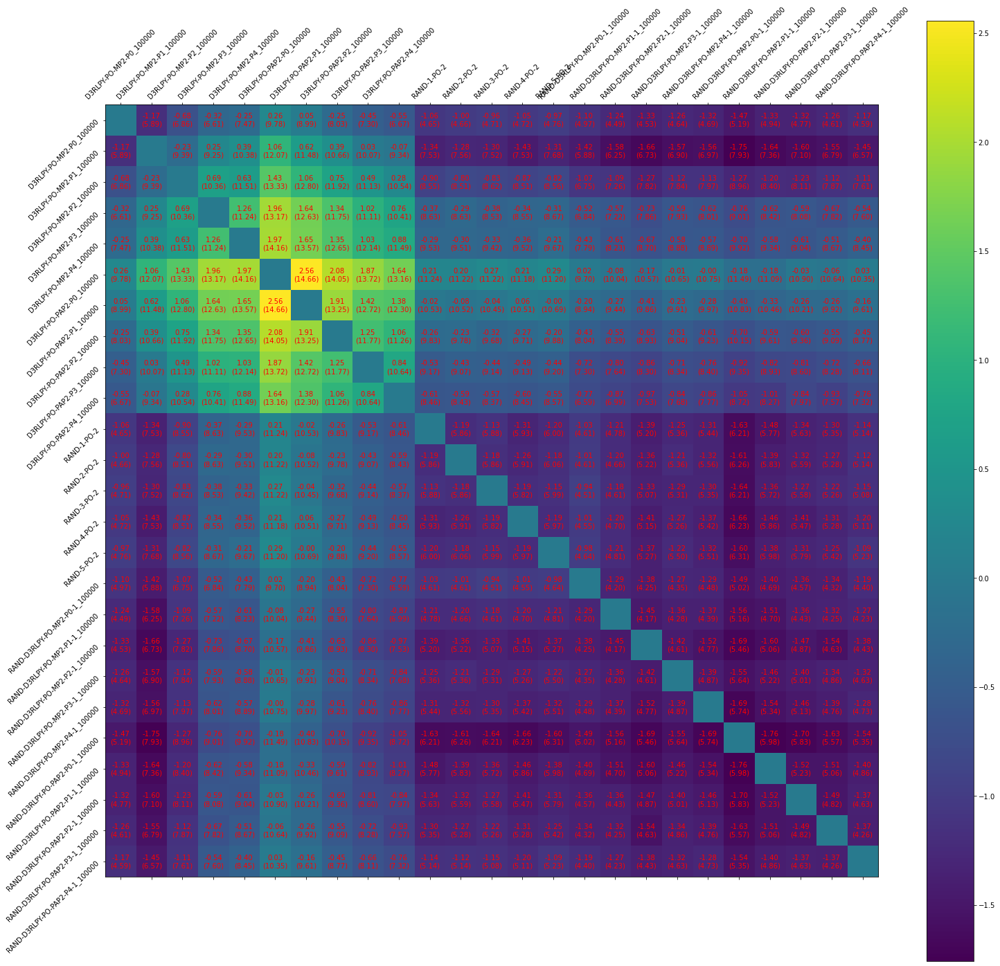

In [25]:
distances_plot(mixed_3_po_2_no_rex_avg-mixed_3_po_2_rex_10_avg, mixed_3_po_2_no_rex_std+mixed_3_po_2_rex_10_std, mixed_3_po_2_datasets, differences=True)
pass

# MP4-P0-3

In [26]:
mp4_p0_3_no_rex_avg, mp4_p0_3_no_rex_std, mp4_p0_3_datasets = results_across_seeds(['MP401', 'MP402', 'MP403'])
mp4_p0_3_rex_01_avg, mp4_p0_3_rex_01_std, _                 = results_across_seeds(['MP404', 'MP405', 'MP406'])
mp4_p0_3_rex_1_avg,  mp4_p0_3_rex_1_std, _                  = results_across_seeds(['MP407', 'MP408', 'MP409'])
mp4_p0_3_rex_10_avg, mp4_p0_3_rex_10_std, _                 = results_across_seeds(['MP410', 'MP411', 'MP412'])

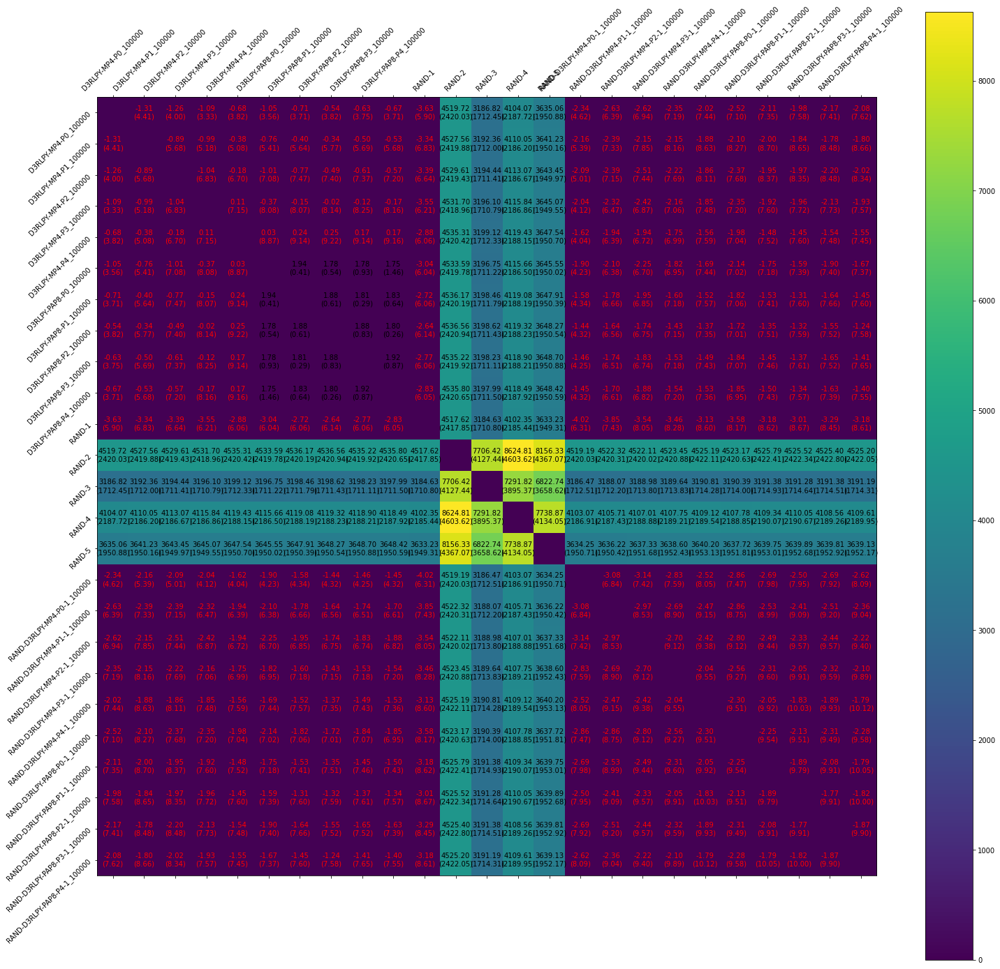

In [27]:
distances_plot(mp4_p0_3_no_rex_avg-mp4_p0_3_rex_10_avg, mp4_p0_3_no_rex_std+mp4_p0_3_rex_10_std, mp4_p0_3_datasets, differences=True)
pass

# MP4-P1-4

In [28]:
mp4_p1_4_no_rex_avg, mp4_p1_4_no_rex_std, mp4_p1_4_datasets = results_across_seeds(['MP413', 'MP414', 'MP415'])
mp4_p1_4_rex_01_avg, mp4_p1_4_rex_01_std, _                 = results_across_seeds(['MP416', 'MP417', 'MP418'])
mp4_p1_4_rex_1_avg,  mp4_p1_4_rex_1_std, _                  = results_across_seeds(['MP419', 'MP420', 'MP421'])
mp4_p1_4_rex_10_avg, mp4_p1_4_rex_10_std, _                 = results_across_seeds(['MP422', 'MP423', 'MP424'])

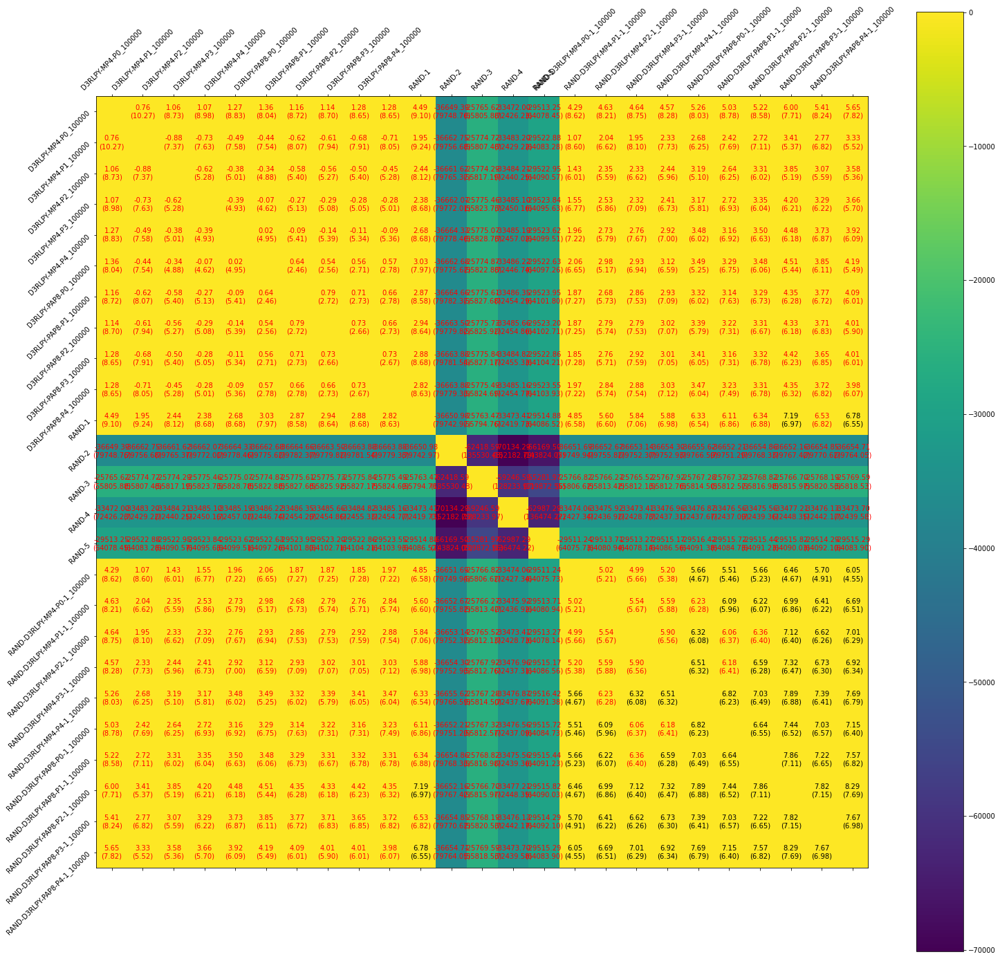

In [29]:
distances_plot(mp4_p1_4_no_rex_avg-mp4_p1_4_rex_10_avg, mp4_p1_4_no_rex_std+mp4_p1_4_rex_10_std, mp4_p1_4_datasets, differences=True)
pass

# PAP8-P0-3

In [30]:
pap8_p0_3_no_rex_avg, pap8_p0_3_no_rex_std, pap8_p0_3_datasets = results_across_seeds(['MP425', 'MP426', 'MP427'])
pap8_p0_3_rex_01_avg, pap8_p0_3_rex_01_std, _                  = results_across_seeds(['MP428', 'MP429', 'MP430'])
pap8_p0_3_rex_1_avg,  pap8_p0_3_rex_1_std, _                   = results_across_seeds(['MP431', 'MP432', 'MP433'])
pap8_p0_3_rex_10_avg, pap8_p0_3_rex_10_std, _                  = results_across_seeds(['MP434', 'MP435', 'MP436'])

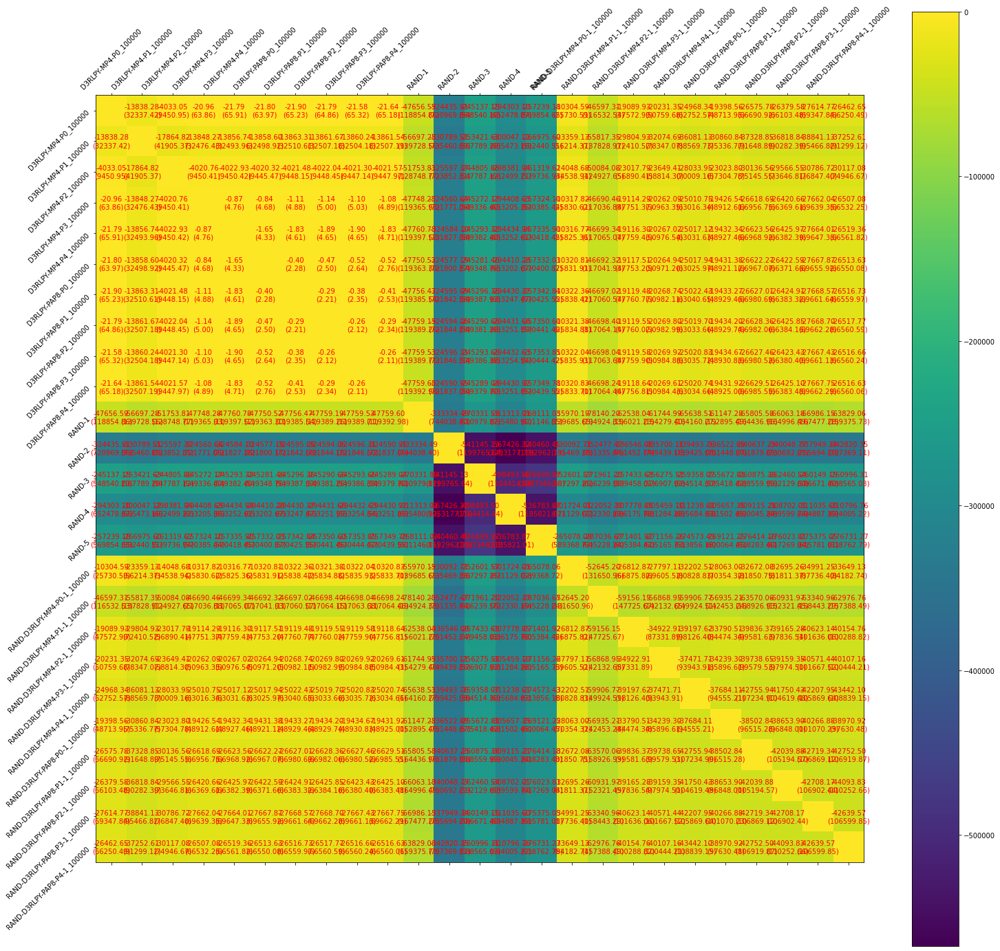

In [31]:
distances_plot(pap8_p0_3_no_rex_avg-pap8_p0_3_rex_10_avg, pap8_p0_3_no_rex_std+pap8_p0_3_rex_10_std, pap8_p0_3_datasets, differences=True)
pass

# PAP8-P1-4

In [32]:
pap8_p1_4_no_rex_avg, pap8_p1_4_no_rex_std, pap8_p1_4_datasets = results_across_seeds(['MP437', 'MP438', 'MP439'])
pap8_p1_4_rex_01_avg, pap8_p1_4_rex_01_std, _                  = results_across_seeds(['MP440', 'MP441', 'MP442'])
pap8_p1_4_rex_1_avg,  pap8_p1_4_rex_1_std, _                   = results_across_seeds(['MP443', 'MP444', 'MP445'])
pap8_p1_4_rex_10_avg, pap8_p1_4_rex_10_std, _                  = results_across_seeds(['MP446', 'MP447', 'MP448'])

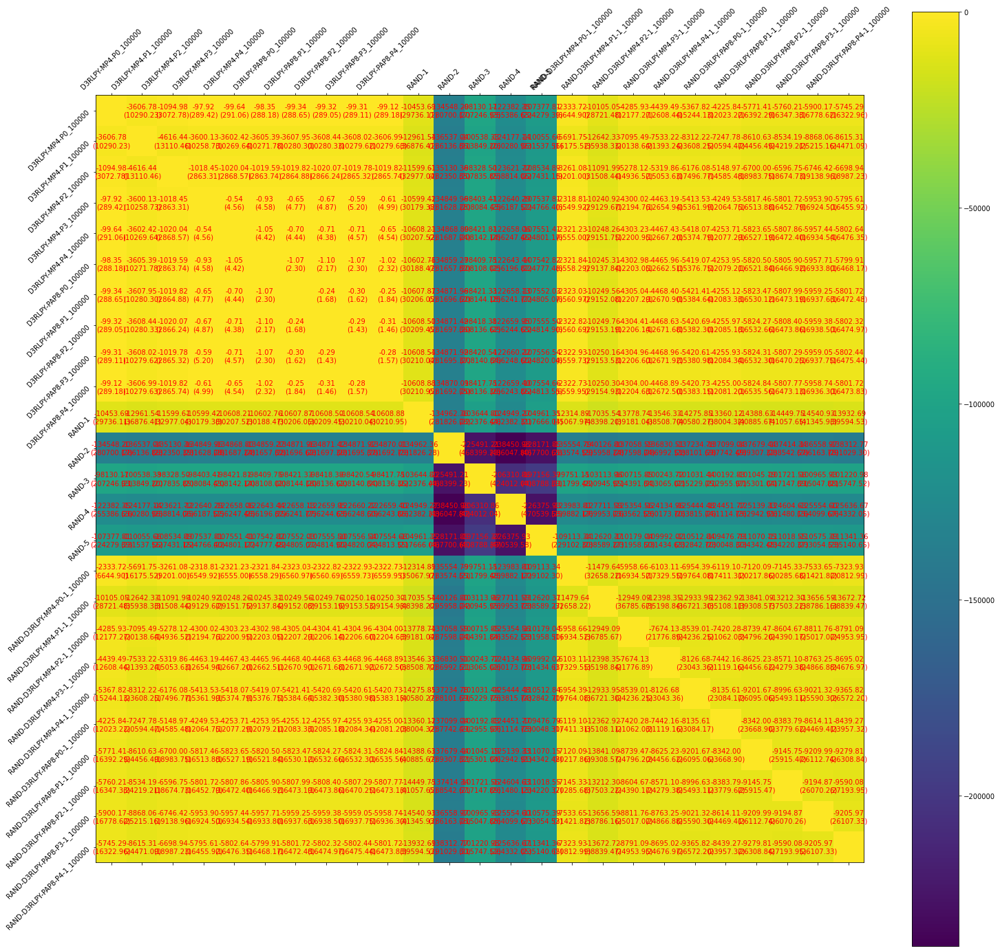

In [33]:
distances_plot(pap8_p1_4_no_rex_avg-pap8_p1_4_rex_10_avg, pap8_p1_4_no_rex_std+pap8_p1_4_rex_10_std, pap8_p1_4_datasets, differences=True)
pass

# Development Work

In [34]:
# SEED = 1443
# SCORES_BASE_DIR = "/home/ajc348/rds/hpc-work/dogo_results/mopo/model_scoring"

In [35]:
# def wasserstein_dist(m1, m2, c1, c2):
#     return (((m1-m2)**2).sum(axis=-1) + (c1+c2-(c1*c2)**0.5).sum(axis=-1)).mean()

In [36]:
##########
# Original
##########

# def experiment_distances(exp, datasets):
#     exp_details = get_experiment_details(exp, get_elites=True)
#     model_dir = os.path.join(exp_details.results_dir, 'models')
#     elites = exp_details.elites
    
#     scores_dir = os.path.join(SCORES_BASE_DIR, model_dir.split("/")[-3], model_dir.split("/")[-2])
#     wd_vals = {}
#     for dataset_1 in datasets:
#         d1_m = np.load(os.path.join(scores_dir, f'{dataset_1}_{SEED}_means.npy'))[elites,:,:]
#         d1_c = np.load(os.path.join(scores_dir, f'{dataset_1}_{SEED}_vars.npy'))[elites,:,:]
#         wd_vals[dataset_1] = {}
#         for dataset_2 in datasets:
#             d2_m = np.load(os.path.join(scores_dir, f'{dataset_2}_{SEED}_means.npy'))[elites,:,:]
#             d2_c = np.load(os.path.join(scores_dir, f'{dataset_2}_{SEED}_vars.npy'))[elites,:,:]
#             wd_vals[dataset_1][dataset_2] = wasserstein_dist(d1_m, d2_m, d1_c, d2_c)
#     return pd.DataFrame().from_dict(wd_vals)

In [37]:
##########
# Latest
##########

# def experiment_distances(exp, datasets):
#     exp_details = get_experiment_details(exp, get_elites=True)
#     model_dir = os.path.join(exp_details.results_dir, 'models')
#     elites = exp_details.elites

#     scores_dir = os.path.join(SCORES_BASE_DIR, model_dir.split("/")[-3], model_dir.split("/")[-2])

#     n_datasets = len(datasets)
#     wd_vals_arr = np.zeros((n_datasets, n_datasets))
#     for i in range(n_datasets):
#         dataset_1 = datasets[i]
#         d1_m = np.load(os.path.join(scores_dir, f'{dataset_1}_{SEED}_means.npy'))[elites,:,:]
#         d1_c = np.load(os.path.join(scores_dir, f'{dataset_1}_{SEED}_vars.npy'))[elites,:,:]
#         for j in range(i+1):
#             dataset_2 = datasets[j]
#             d2_m = np.load(os.path.join(scores_dir, f'{dataset_2}_{SEED}_means.npy'))[elites,:,:]
#             d2_c = np.load(os.path.join(scores_dir, f'{dataset_2}_{SEED}_vars.npy'))[elites,:,:]
#             wd_vals_arr[i,j] = wasserstein_dist(d1_m, d2_m, d1_c, d2_c)
#         print(f'Completed {i+1}/{n_datasets} datasets')
#     return wd_vals_arr + wd_vals_arr.T - np.diag(wd_vals_arr.diagonal())

In [38]:
# def distances_plot(wd_vals_arr, datasets):
#     fig, ax = plt.subplots(1, 1, figsize=(10,10))

#     mat = ax.matshow(wd_vals_arr)
#     ax.set_xticklabels(['']+list(datasets), rotation=45)
#     ax.set_yticklabels(['']+list(datasets), rotation=45)

#     for (i,j), z in np.ndenumerate(wd_vals_arr):
#         if z != 0:
#             ax.text(j, i, str(z), ha="center", va="center")

#     fig.colorbar(mat)

#     return fig